# Рынок заведений общественного питания в Москве

## Цель аналитического проекта: 

Провести исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места для открытия бизнеса в сфере общественного питания.

## Исходные данные: 

Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, носит исключительно справочный характер.

Описание данных

Файл moscow_places.csv:

name — название заведения;

address — адрес заведения;

category — категория заведения, например «кафе», «пиццерия» или «кофейня»;

hours — информация о днях и часах работы;

lat — широта географической точки, в которой находится заведение;

lng — долгота географической точки, в которой находится заведение;

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым

district — административный район, в котором находится заведение, например Центральный административный округ;

seats — количество посадочных мест.

## План проекта

Шаг 1. [Загрузка данных и общая информация](#section1_id)

Шаг 2. [Выполните предобработку данных](#section2_id)

Шаг 3. [Анализ данных](#section3_id)

Шаг 4. [Детализируем исследование: открытие кофейни](#section4_id)

Шаг 5. [Подготовка презентации](#section5_id)



In [1]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import re
from plotly import graph_objects as go
# импортируем карту и хороплет
from folium import Marker, Map, Choropleth
# импортируем кластер
from folium.plugins import MarkerCluster
import math
from math import sqrt




## Шаг 1. Загрузка данных и общая информация
<a id='section1_id'></a>


Датасет доступен по ссылке: https://disk.yandex.ru/d/pQ6RoXGWGlxk-Q Карта Москвы: https://disk.yandex.ru/d/aPtbACm8zMHmOA
Необходимо скачать датасет и изменить path (см.ниже)



In [8]:
path = 'C:\\Users\\A\\Desktop\\Project_Coffee\\'
data = pd.read_csv(path + 'moscow_places.csv', sep=',') 

#data = pd.read_csv('/datasets/moscow_places.csv', sep=',')
#sep='\t'
pd.options.display.max_colwidth = 100
print(data)

                      name  category  \
0                   WoWфли      кафе   
1           Четыре комнаты  ресторан   
2                    Хазри      кафе   
3     Dormouse Coffee Shop   кофейня   
4                Иль Марко  пиццерия   
...                    ...       ...   
8401            Суши Мания      кафе   
8402             Миславнес      кафе   
8403               Самовар      кафе   
8404          Чайхана Sabr      кафе   
8405            Kebab Time      кафе   

                                         address  \
0                     Москва, улица Дыбенко, 7/1   
1             Москва, улица Дыбенко, 36, корп. 1   
2                 Москва, Клязьминская улица, 15   
3            Москва, улица Маршала Федоренко, 12   
4                Москва, Правобережная улица, 1Б   
...                                          ...   
8401               Москва, Профсоюзная улица, 56   
8402  Москва, Пролетарский проспект, 19, корп. 1   
8403      Москва, Люблинская улица, 112А, стр. 1   

In [9]:
data.shape

(8406, 14)

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В исходном файле 14 колонок и 8406 строк
Есть пропуски в данных в hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats

## Шаг 2. Предобработка данных
<a id='section2_id'></a>
ПРоверка на дубликаты в данных и пропуски. 
Предобработка данных:
Добавить столбец street с названиями улиц из столбца с адресом.
Добавить столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.



In [11]:
#поиск явных дубликатов
data.duplicated().sum()

np.int64(0)

Явных дубликатов не обнаружено. Посмотрим, есть ли неявные дубликаты.


In [12]:
#поиск неявных дубликатов по имени и адресу:
data[['name', 'address']].duplicated().sum()

np.int64(0)

In [13]:
#поиск неявных дубликатов по имени и адресу:
data['name_low'] = data['name'].str.lower()
data['address_low'] = data['address'].str.lower()
data[['name_low', 'address_low']].duplicated().sum()


np.int64(4)

По столбцам название и адрес найдено 4 дубликата

In [14]:
#удаляю дубликаты
data = data.drop_duplicates(subset=['name_low', 'address_low'], keep='first') 


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  name_low           8402 non-null   object 
 15  address_low        8402 non-null   object 
dtypes: float64(6), int64(1), obje

In [16]:
data[['name', 'address']].value_counts()

name                    address                                        
#КешбэкКафе             Москва, Большая Татарская улица, 11С               1
Наби                    Москва, улица Можайский Вал, 10, стр. 21           1
На углях                Москва, Ярцевская улица, 22А, корп. 2              1
На углу                 Москва, улица Рогожский Вал, 5, стр. 1             1
На мангале              Москва, проспект Мира, 119, стр. 503               1
                                                                          ..
Белорусская хата        Москва, улица Покровка, 9с1                        1
Белое озеро             Москва, Большая Косинская улица, 24А               1
Беллини                 Москва, Рублёвское шоссе, 28                       1
Белла ЧАО пицца и кофе  Москва, Ленинградский проспект, 80, корп. 17, A    1
ночной Баку             Москва, улица Новинки, 12Б                         1
Name: count, Length: 8402, dtype: int64

In [17]:
data[['name']].value_counts()

name            
Кафе                188
Шоколадница         120
Домино'с Пицца       76
Додо Пицца           74
One Price Coffee     71
                   ... 
Бегония-Л             1
Беби Джоли            1
Баяр                  1
Башлам                1
ночной Баку           1
Name: count, Length: 5613, dtype: int64

Дубликатов в названии и адресе не выявлено, 
По имени дублируются сетевые заведения, возможны просто совпадения имен.

Далее посмотрим пропуски:

In [18]:
data[data['hours'].isna()]['category'].unique()

array(['булочная', 'кафе', 'быстрое питание', 'бар,паб', 'пиццерия',
       'ресторан', 'кофейня', 'столовая'], dtype=object)

In [19]:
data[data['hours'].isna()].groupby('category')[['category']].count()

,category
category,
"бар,паб",18
булочная,7
быстрое питание,33
кафе,374
кофейня,15
пиццерия,5
ресторан,74
столовая,9


По типу категории с пропусками часов работы преобладают Кафе. Но и пиццерии и даже булочные могут бытьи круглосуточными, так и не круглосуточными. Вывод сделать сложно. 
Заполним пропуски в часах работы на "Нет данных"

In [20]:
# заполняем пропуски в hours
data['hours'] = data['hours'].fillna('неизвестно')

In [21]:
#создаем столбец с улицей

words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия', 'сквер', 
         'просек', 'квартал', 'парк', 'парк культуры и отдыха', 'километр', 'дорога']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

data["street"] = data["address"].str.extract(str_pat, flags=re.I)

In [22]:
#по каким адресам не удалось выделить столбец с улицей:

data[data['street'].isna()].groupby('address')[['category']].count()

,category
address,
"Москва, 2-й Павелецкий проезд",1
"Москва, 2-й Силикатный проезд",1
"Москва, 2-я Филёвская улица",1
"Москва, 3-й Лучевой просек",1
"Москва, Авиамоторная улица",1
...,...
"Москва, сквер имени М.И. Калинина",1
"Москва, улица Гиляровского",1
"Москва, улица Черняховского",1


In [23]:
data[data['street'].isna()]['address'].unique()

array(['Москва, парк Левобережный',
       'Москва, ландшафтный заказник Лианозовский',
       'Москва, Лианозовский парк культуры и отдыха',
       'Москва, парк Алтуфьево', 'Москва, парк Ангарские пруды',
       'Москва, Проектируемый проезд № 5265',
       'Москва, парк Ангарские Пруды',
       'Москва, парк Этнографическая деревня Бибирево',
       'Москва, Северный административный округ, Головинский район',
       'Москва, парк культуры и отдыха Северное Тушино',
       'Москва, Северо-Западный административный округ, район Северное Тушино',
       'Москва, парк Дружбы', 'Москва, Ленинградское шоссе',
       'Москва, Северный административный округ, район Левобережный, территория парка Дружбы',
       'Москва, Коптевский бульвар д 18 А стр 1',
       'Москва, Грузинский сквер',
       'Москва, Северо-Восточный административный округ, район Отрадное',
       'Москва, Северо-Восточный административный округ, Останкинский район, Выставка достижений народного хозяйства, Кольцевая дор

In [25]:
#price и avg_bill тип Object, пропуски заполняем значением "Нет данных"

data['price'] = data['price'].fillna('Нет данных')
data['avg_bill'] = data['avg_bill'].fillna('Нет данных')

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              8402 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              8402 non-null   object 
 9   avg_bill           8402 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  name_low           8402 non-null   object 
 15  address_low        8402 non-null   object 
 16  street             8258 non-n

Создать столбец is_24_7 для тех, кто работает ежедневно, круглосуточно.

In [27]:
data['is_24_7'] = data['hours'].apply(lambda x: 'True' if x == 'ежедневно, круглосуточно' else 'False')

In [28]:
data['chain'] = data['chain'].apply(lambda x: 'сетевое' if x == 1 else 'не сетевое')

In [29]:
#кол-во выбросов по самым дорогим заведениям
data[data['middle_avg_bill']>=6000]['name'].count()

np.int64(8)

In [30]:
#убираем выбросы по очень дорогим заведениям
#data=data[data['middle_avg_bill']<6000]

In [31]:
data[data['middle_avg_bill'].isna()]['middle_coffee_cup'].count()

np.int64(535)

Т.Е. указана либо ср.цена middle_avg_bill, либо middle_coffee_cup

In [32]:
data_temp = data[data['middle_avg_bill'].isna()]
data_temp = data_temp[data['middle_coffee_cup'].isna()]
display(data_temp['avg_bill'].unique())
data_temp['category'].unique()

C:\Users\A\AppData\Local\Temp\ipykernel_17680\2567708552.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_temp = data_temp[data['middle_coffee_cup'].isna()]


array(['Нет данных', 'Цена бокала пива:250–350 ₽',
       'Цена бокала пива:120–350 ₽', 'Цена бокала пива:90–230 ₽',
       'Цена бокала пива:160–499 ₽', 'Цена бокала пива:199–300 ₽',
       'Цена бокала пива:от 140 ₽', 'Цена бокала пива:от 149 ₽',
       'Цена бокала пива:150–450 ₽', 'Цена бокала пива:130–150 ₽',
       'Цена бокала пива:220–350 ₽', 'Цена бокала пива:180–330 ₽',
       'Цена бокала пива:220–550 ₽', 'Цена бокала пива:150–290 ₽',
       'Цена бокала пива:320–440 ₽', 'Цена бокала пива:370–410 ₽',
       'Цена бокала пива:320–460 ₽', 'Цена бокала пива:180–420 ₽',
       'Цена бокала пива:280 ₽', 'Цена бокала пива:150–350 ₽',
       'Цена бокала пива:270–390 ₽', 'Цена бокала пива:200–440 ₽',
       'Цена бокала пива:380–400 ₽', 'Цена бокала пива:260–380 ₽',
       'Цена бокала пива:200–300 ₽', 'Цена бокала пива:от 350 ₽',
       'Цена бокала пива:от 200 ₽', 'Цена бокала пива:100–250 ₽',
       'Цена бокала пива:от 195 ₽', 'Цена бокала пива:240–380 ₽',
       'Цена бокала п

array(['кафе', 'пиццерия', 'бар,паб', 'булочная', 'кофейня',
       'быстрое питание', 'ресторан', 'столовая'], dtype=object)

В столбец middle_avg_bill вошли данные только по тем заведениям, где указан средний счет, но если указана средняя цена за бокал пива - данные по ср чеку по этим заведениям не войдут в анализ.

In [33]:
#Добавляем столбец с аббревиатурой районов для компактного вывода на графиках
data['district_small'] = data['district']
data['district_small'].replace({'Восточный административный округ': 'ВАО', \
                          'Центральный административный округ': 'ЦАО',\
                          'Юго-Западный административный округ':'ЮЗАО',\
                          'Западный административный округ':'ЗАО',\
                          'Северо-Западный административный округ':'СЗАО',\
                          'Северо-Восточный административный округ':'СВАО',\
                          'Северный административный округ':'САО',\
                          'Южный административный округ':'ЮАО',\
                          'Юго-Восточный административный округ':'ЮВАО'}, inplace=True)

C:\Users\A\AppData\Local\Temp\ipykernel_17680\3660976185.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['district_small'].replace({'Восточный административный округ': 'ВАО', \


Выводы по разделу:

Выполнен поиск явных и неявных дубликатов, дубли не выявлены.
Проведена предобработка данных, 

заполнены пропуски:
в столбце hours "не известно"
в столбцах price, avg_bill тип Object "Нет данных"

## Шаг 3. Анализ данных
<a id='section3_id'></a>

### Какие категории заведений представлены в данных:

Какие категории заведений представлены в данных? Количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. 


In [37]:
data_cattegory_pivot = data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name', ascending=False)
data_cattegory_pivot

,name
category,
кафе,2376
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


В предоставленных данных бОльшую часть занимают кафе (2278 заведений или 28,3%) и рестораны (2043 или 24,3%)

<Figure size 2000x2000 with 0 Axes>

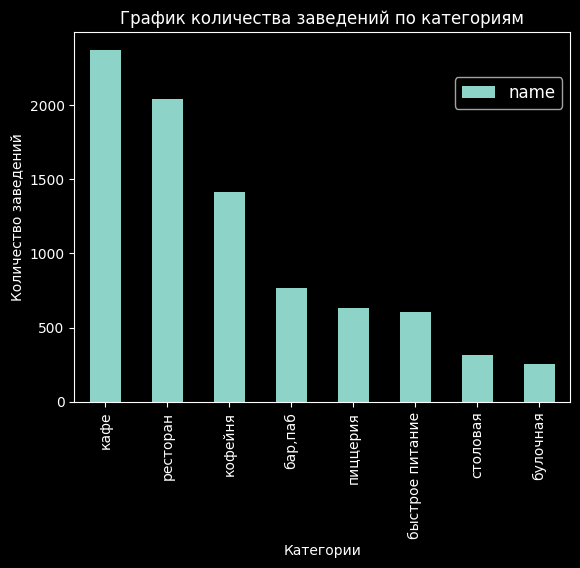

In [38]:
plt.figure(figsize=(20, 20))
plt.style.use("dark_background")
data_cattegory_pivot.plot(kind='bar', stacked=True)

plt.title('График количества заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

### Количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 


C:\Users\A\AppData\Local\Temp\ipykernel_17680\2269485879.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\A\AppData\Local\Temp\ipykernel_17680\2269485879.py:5: UserWarning:

The palette list has more values (10) than needed (8), which may not be intended.



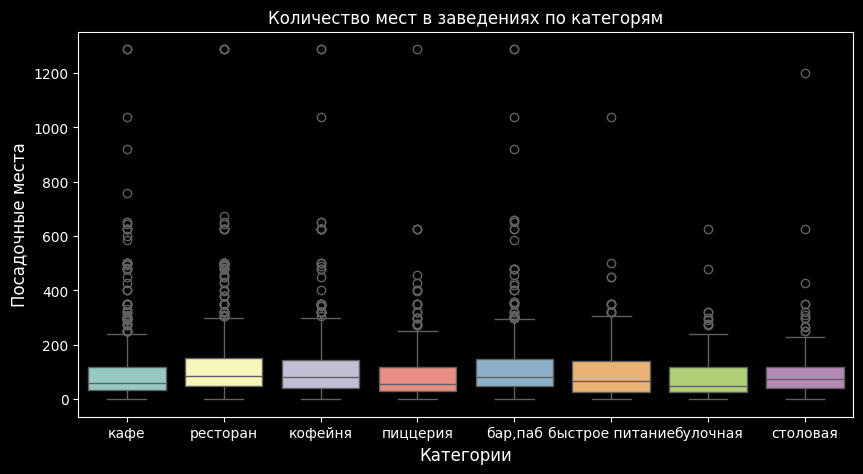

In [39]:
colors = sns.color_palette()

plt.figure(figsize=(10, 5))

boxplot = sns.boxplot(x=data["category"], y=data['seats'], palette=colors);
boxplot.axes.set_title("Количество мест в заведениях по категорям", fontsize=12)
boxplot.set_xlabel("Категории", fontsize=12)
boxplot.set_ylabel("Посадочные места", fontsize=12);


In [40]:
data[data['seats']>1000][['name', 'category', 'address', 'seats' ]]

,name,category,address,seats
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",1040.0
2722,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",1040.0
2770,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",1040.0
2966,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",1040.0
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",1200.0
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",1288.0
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",1288.0
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",1288.0
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",1288.0
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",1288.0


Предположительно ошибка в количестве мест:
по адресу Москва, Измайловское шоссе, 71, корп. А указаны 4 заведения и одинаковое количество мест 1040
по адресу Москва, Кутузовский проспект, 41, стр. 1 - Банкетный зал на 35 человек (https://www.google.com/search?q=%D1%80%D0%B5%D1%81%D1%82%D0%BE%D0%B1%D0%B0%D1%80+argomento+%D0%BA%D0%BE%D0%BB%D0%B8%D1%87%D0%B5%D1%81%D1%82%D0%B2%D0%BE+%D0%BC%D0%B5%D1%81%D1%82+%D0%B2+%D0%B7%D0%B0%D0%BB%D0%B5&sca_esv=7bfb32b140944815&sca_upv=1&sxsrf=ADLYWIJ9OU36Ebo6pxUq8v5mbVvGGVIs9g%3A1727249698740&ei=Ir3zZu_gLNbbwPAPxOH26Qc&oq=%D0%A0%D0%B5%D1%81%D1%82%D0%BE%D0%91%D0%B0%D1%80+Argomento+%D0%BA%D0%BE%D0%BB%D0%B8%D1%87%D0%B5%D1%81%D1%82%D0%B2%D0%BE+&gs_lp=Egxnd3Mtd2l6LXNlcnAiMNCg0LXRgdGC0L7QkdCw0YAgQXJnb21lbnRvINC60L7Qu9C40YfQtdGB0YLQstC-ICoCCAEyBRAhGKABMgUQIRigATIFECEYoAEyBRAhGKABMgUQIRigAUiSPVC5AligK3ABeACQAQCYAXigAZAIqgEEMTAuMrgBAcgBAPgBAZgCDKACtwjCAgkQIRigARgKGCrCAgcQIRigARgKmAMAiAYBkgcEMTAuMqAH10g&sclient=gws-wiz-serp)

На Проспекте Вернадского 11 заведений с одинаковым количеством мест 1288.



In [41]:
data.query(('seats>400 & seats<=1000'))[['name', 'category', 'address', 'seats']].sort_values(by='seats', ascending = False)

,name,category,address,seats
4180,Eataly,"бар,паб","Москва, Киевская улица, 2",920.0
4245,Стейк & Бургер,кафе,"Москва, Киевская улица, 2",920.0
5486,Дом,кафе,"Москва, улица Юности, 1",760.0
7987,Ресторан,ресторан,"Москва, улица Маршала Захарова, 6, корп. 1",675.0
2913,Хаус бар,"бар,паб","Москва, Измайловское шоссе, 71, корп. 2Б",660.0
...,...,...,...,...
7761,Pratto Pizza,ресторан,"Москва, Чертановская улица, 40, корп. 1",428.0
7740,"Ресторан, кафе, бар","бар,паб","Москва, Чертановская улица, 40, корп. 1",428.0
6975,Додо Пицца,пиццерия,"Москва, Чертановская улица, 12, корп. 1",428.0
7594,Хочу шашлык,столовая,"Москва, Чертановская улица, 47, корп. 1",428.0


От 400 до 1000 посадочных мест имеют еще 105 заведений. Причем складывается ощущение, что указано суммарное количество мест для всех заведений по конкретному адресу, либо близлежащим домам: например Москва, Чертановская улица, 40, корп. 1, дом 12 и дом 47 - все четыре заведения имеют 428 посадочных мест. 

Мы можем попробовать исправить количество мест там, где единый адрес: разделить указанное количество мест на количество заведений по адресу.


In [42]:
seats_max = data.query('seats>400').groupby(['address']).agg({'seats': 'max', 'name':'count'})
seats_max['avg_seat'] = round(seats_max['seats']/seats_max['name'],0)
seats_max = seats_max.query('name>1 & name<16')
seats_max = seats_max.rename(columns={
    'seats':'seats_new',
    'name':'cnt_id'
}) 
seats_max

,seats_new,cnt_id,avg_seat
address,,,
"Москва, Автозаводская улица, 18",455.0,4,114.0
"Москва, Измайловское шоссе, 71, корп. 2Б",660.0,2,330.0
"Москва, Измайловское шоссе, 71, корп. А",1040.0,4,260.0
"Москва, Киевская улица, 2",920.0,2,460.0
"Москва, Ленинградский проспект, 31А, стр. 1",625.0,4,156.0
"Москва, Ленинградский проспект, 69, стр. 1",625.0,2,312.0
"Москва, Ленинградский проспект, 72, корп. 1",625.0,3,208.0
"Москва, Ленинградский проспект, 74, корп. 1",625.0,2,312.0
"Москва, Ленинградский проспект, 78, корп. 1",625.0,2,312.0


In [43]:
# обновляем значения seats в основном файле на новые значения
data = data.merge(seats_max, on='address', how='left')

def avg_seat_corr (row):
    new_seat = row['avg_seat']
    if new_seat >0:
        return new_seat
    return
data['seats'] = data.apply(avg_seat_corr, axis=1)

In [44]:
#проверка
data[data['address']=="Москва, улица Ленинская Слобода, 19"][['seats',  'avg_seat']]

,seats,avg_seat
6384,75.0,75.0
6388,75.0,75.0
8031,75.0,75.0
8091,75.0,75.0
8106,75.0,75.0
8194,75.0,75.0


C:\Users\A\AppData\Local\Temp\ipykernel_17680\1226535263.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\A\AppData\Local\Temp\ipykernel_17680\1226535263.py:9: UserWarning:

The palette list has more values (10) than needed (8), which may not be intended.



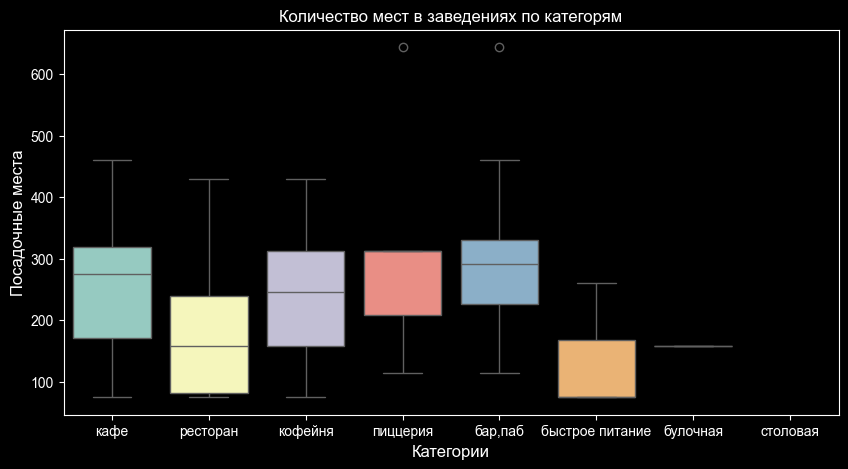

In [45]:
#обновленный график после чистки аномалий:
sns.set_style("ticks") 
plt.style.use("dark_background")

colors = sns.color_palette()

plt.figure(figsize=(10, 5))

boxplot = sns.boxplot(x=data["category"], y=data['seats'], palette=colors);
boxplot.axes.set_title("Количество мест в заведениях по категорям", fontsize=12)
boxplot.set_xlabel("Категории", fontsize=12)
boxplot.set_ylabel("Посадочные места", fontsize=12)
plt.savefig(r'C:\\Users\\A\\Desktop\\Я_ПРАКТИКУМ\ПРоект Рассказать историю в данных\\Файлы для презы\\seats.png')

Медианное значение количества посадочных мест для кафе и баров выше, чем в кофейнях и ресторанах. В булочных и столовых посадочных мест практически нет.
В пиццерия и барах в отдельных случаях есть заведения с количеством мест более 600. СтОит проверить их выборочно.

In [46]:
data.query(('seats>600'))[['name', 'category', 'address', 'seats']].sort_values(by='seats', ascending = False)

,name,category,address,seats
6570,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",644.0
6654,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",644.0


### Соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
Какие категории заведений чаще являются сетевыми? 

In [47]:
# группируем данные по категориям и Признаку сетевой/несетевой и считаем кол-во заведений
data_chain = data.groupby(['category', 'chain'], \
                        as_index = False)[['name']].count()
data_chain

,category,chain,name
0,"бар,паб",не сетевое,596
1,"бар,паб",сетевое,168
2,булочная,не сетевое,99
3,булочная,сетевое,157
4,быстрое питание,не сетевое,371
5,быстрое питание,сетевое,232
6,кафе,не сетевое,1597
7,кафе,сетевое,779
8,кофейня,не сетевое,693
9,кофейня,сетевое,720


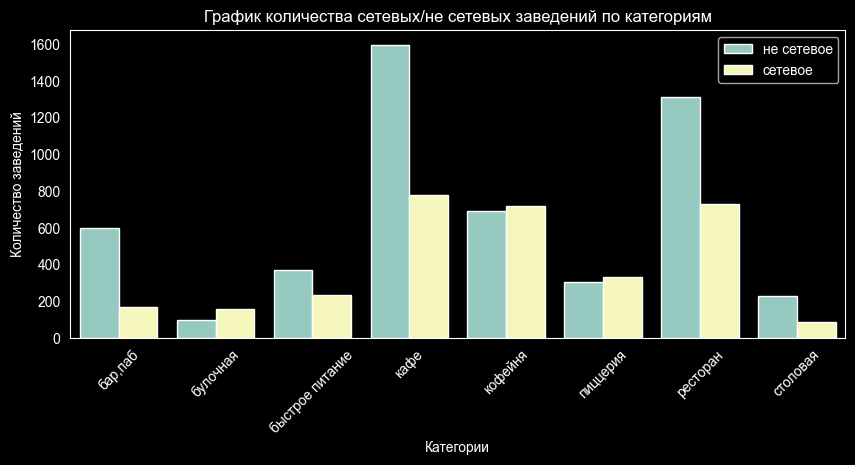

In [48]:
# используем стиль dark из библиотеки seaborn
sns.set_style('dark')
plt.style.use("dark_background")

# назначаем размер графика
plt.figure(figsize=(10, 4))
# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='name', data=data_chain, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График количества сетевых/не сетевых заведений по категориям')
plt.xlabel('Категории')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='best', fontsize=10)
# не добавляем сетку
#plt.grid()
# отображаем график на экране
plt.show()

Преобладают сетевые кафе и рестораны, а вот несетевых кофеен и пиццерий немного больше, чем сетевых.

,name
chain,
не сетевое,5199
сетевое,3203


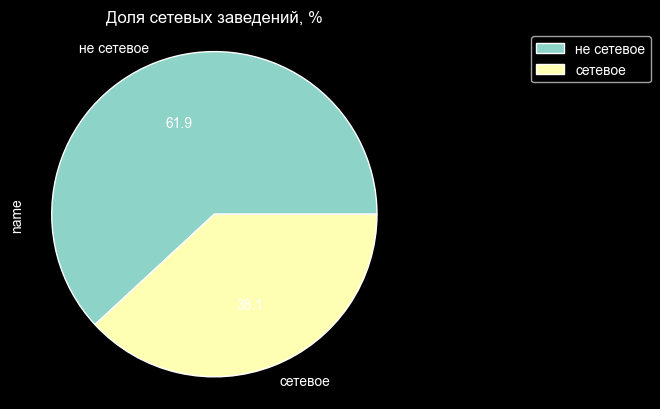

In [104]:
ax = data
ax = ax.pivot_table(index='chain', values='name', aggfunc='count')
ax = ax.sort_values(by='name', ascending=False)
display(ax)

ax=ax.plot(x='chain', y='name', kind='pie', autopct='%.1f', radius = 1.1)
plt.title('Доля сетевых заведений, %')
ax.legend(bbox_to_anchor = (1.2, 0.5, 0.5, 0.5))
plt.show()


Не сетевых заведений в целом больше, чем сетевых = 61,9%

In [59]:
data_chain_pivot = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count', margins=True)
data_chain_pivot['chain_%'] = round(data_chain_pivot['сетевое']/data_chain_pivot['All']*100,1)
data_chain_pivot = data_chain_pivot.iloc[:-1]
display(data_chain_pivot)
data_chain_pivot = data_chain_pivot.iloc[:, -1]
data_chain_pivot


chain,не сетевое,сетевое,All,chain_%
category,,,,
"бар,паб",596,168,764,22.0
булочная,99,157,256,61.3
быстрое питание,371,232,603,38.5
кафе,1597,779,2376,32.8
кофейня,693,720,1413,51.0
пиццерия,303,330,633,52.1
ресторан,1313,729,2042,35.7
столовая,227,88,315,27.9


category
бар,паб            22.0
булочная           61.3
быстрое питание    38.5
кафе               32.8
кофейня            51.0
пиццерия           52.1
ресторан           35.7
столовая           27.9
Name: chain_%, dtype: float64

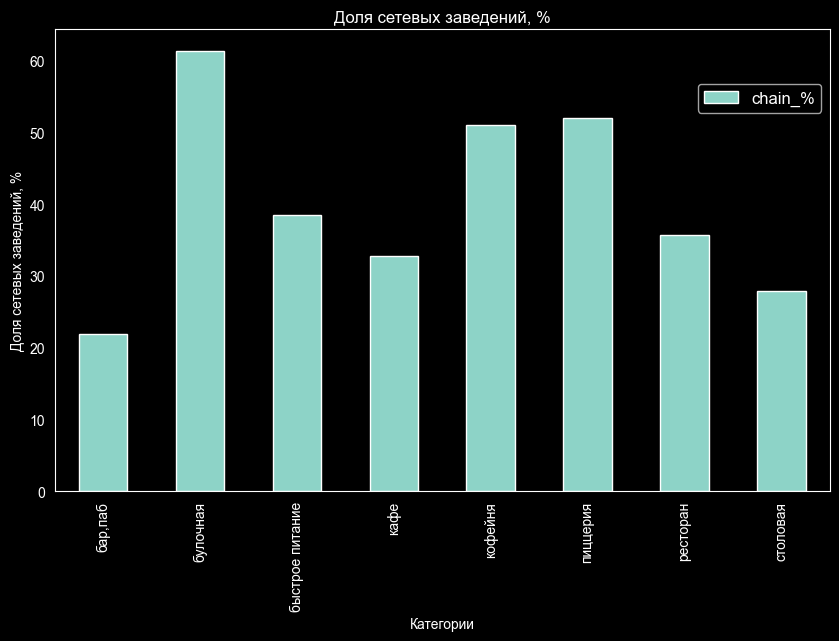

In [61]:
plt.figure(figsize=(10, 6))

data_chain_pivot.plot(kind='bar', stacked=True)

plt.title('Доля сетевых заведений, %')
plt.xlabel('Категории')
plt.ylabel('Доля сетевых заведений, %')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

Самая дольшая доля сетеых заведений у булочных 61%,

Пиццерии и кофейни 52% и 51% соответственно.

### топ-15 популярных сетей в Москве
Выделить топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. 


In [62]:
# отфильтруем данные, сгруппируем по городам и посчитаем кол0во заведений
top_15_chain = data.loc[data['chain'] == 'сетевое'].groupby(['name', 'category'])[['name']].count()
# переименуем столбец
top_15_chain.columns = ['total_count']
# отсортируем и оставим  лидеров
top_15_chain = top_15_chain.reset_index().sort_values(by='total_count', ascending=False).head(15)
display(top_15_chain)

,name,category,total_count
1142,Шоколадница,кофейня,119
504,Домино'с Пицца,пиццерия,76
497,Додо Пицца,пиццерия,74
206,One Price Coffee,кофейня,71
1158,Яндекс Лавка,ресторан,69
73,Cofix,кофейня,65
242,Prime,ресторан,49
558,КОФЕПОРТ,кофейня,42
644,Кулинарная лавка братьев Караваевых,кафе,39
978,Теремок,ресторан,36


In [63]:
# строим столбчатую диаграмму 

fig = px.bar(top_15_chain.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             template= "plotly_dark",
            
             text='total_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 сетевых заведений',
                   xaxis_title='Количество заведений в сети',
                   yaxis_title='Наименование сети')

fig.show() # выводим график

По сетевым заведениям преобладает кофейня Шоколадница. Сетевые заведения представлены в равной степенью кофейни, пиццерии, рестораны и кафе.

### Административные районы Москвы 
Какие административные районы Москвы присутствуют в датасете? Общее количество заведений и количество заведений каждой категории по районам. 


In [64]:
data_district_pivot = data.pivot_table(index = 'district', columns = 'category', values = 'name', aggfunc = 'count')
data_district_pivot.columns = ['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая' ]
data_district_pivot

,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,234,193,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


<Figure size 2000x2000 with 0 Axes>

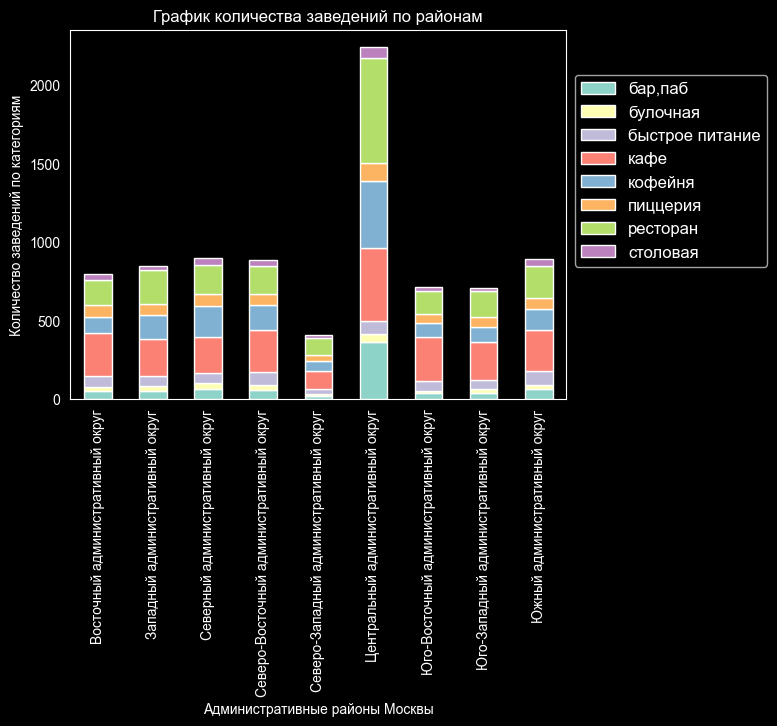

In [65]:
plt.figure(figsize=(20, 20))
plt.style.use("dark_background")
data_district_pivot.plot(kind='bar', stacked=True)

plt.title('График количества заведений по районам')
plt.xlabel('Административные районы Москвы')
plt.ylabel('Количество заведений по категориям')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

По количеству заведений лидирует ЦАО, в котором преобладают бары, кофейни, кафе и рестораны. САО, СВАО, ЮАО представлены примерно одинаково, меньше всего заведений в СЗАО.

### Распределение средних рейтингов по категориям заведений 



In [66]:
# сгруппируем по категориям и посчитаем рейтинг по медианам 
data_rating = data.groupby(['category'])[['rating']].median()
# переименуем столбец
data_rating.columns = ['median_rating']
# отсортируем 
data_rating = data_rating.reset_index().sort_values(by='median_rating', ascending=False)
display(data_rating)



,category,median_rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


<Figure size 2000x2000 with 0 Axes>

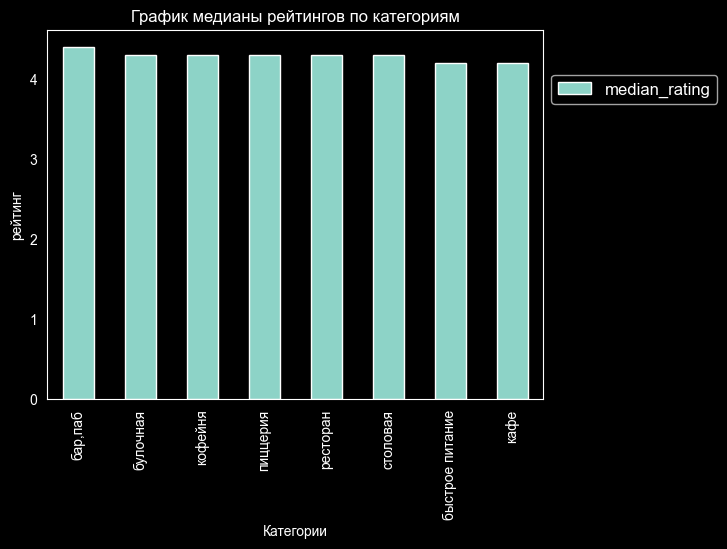

In [67]:
plt.figure(figsize=(20, 20))

data_rating.plot(x='category', y='median_rating', kind='bar')

plt.title('График медианы рейтингов по категориям')
plt.xlabel('Категории')
plt.ylabel('рейтинг')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

По медиане рейтинги мало отличаются: 4,2 - 4,4

,category,avg_rating
0,"бар,паб",4.387696
5,пиццерия,4.301264
6,ресторан,4.290402
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.124285
2,быстрое питание,4.050249


<Figure size 2000x2000 with 0 Axes>

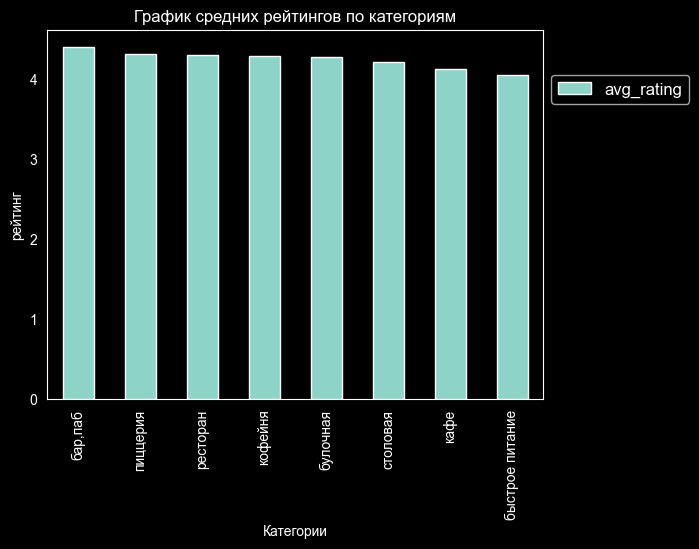

In [68]:
# сгруппируем по категориям и посчитаем рейтинг по среднему значению 
data_rating = data.groupby(['category'])[['rating']].mean()
# переименуем столбец
data_rating.columns = ['avg_rating']
# отсортируем 
data_rating = data_rating.reset_index().sort_values(by='avg_rating', ascending=False)
display(data_rating)

plt.figure(figsize=(20, 20))

data_rating.plot(x='category', y='avg_rating', kind='bar')

plt.title('График средних рейтингов по категориям')
plt.xlabel('Категории')
plt.ylabel('рейтинг')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

In [69]:
data_rating = data.pivot_table(index = 'category', values = 'rating', aggfunc=['mean', 'median'])
data_rating

,mean,median
,rating,rating
category,,
"бар,паб",4.387696,4.4
булочная,4.268359,4.3
быстрое питание,4.050249,4.2
кафе,4.124285,4.2
кофейня,4.277282,4.3
пиццерия,4.301264,4.3
ресторан,4.290402,4.3
столовая,4.211429,4.3


<Figure size 2000x2000 with 0 Axes>

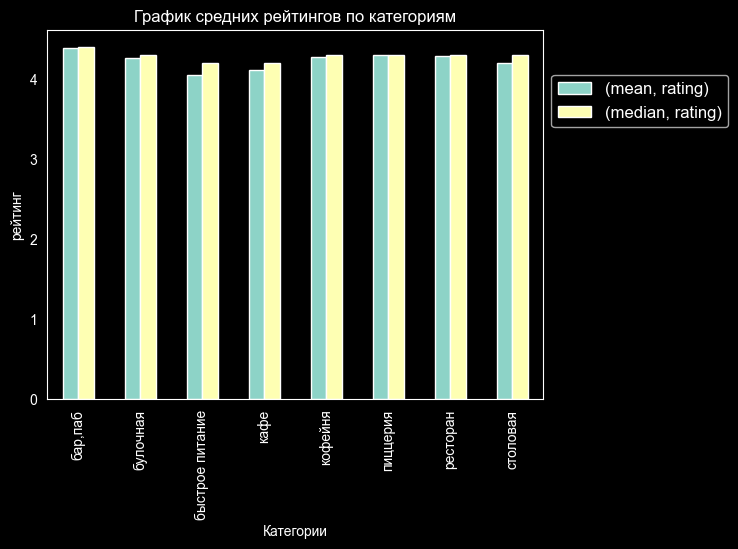

In [70]:
plt.figure(figsize=(20, 20))

data_rating.plot(kind='bar')

plt.title('График средних рейтингов по категориям')
plt.xlabel('Категории')
plt.ylabel('рейтинг')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

Медианы рейтингов чуть выше, чем их средние значения, но в целом  значения очень близки. 

C:\Users\A\AppData\Local\Temp\ipykernel_17680\2801931869.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\A\AppData\Local\Temp\ipykernel_17680\2801931869.py:9: UserWarning:

The palette list has more values (10) than needed (8), which may not be intended.



Text(0, 0.5, 'Рейтинги')

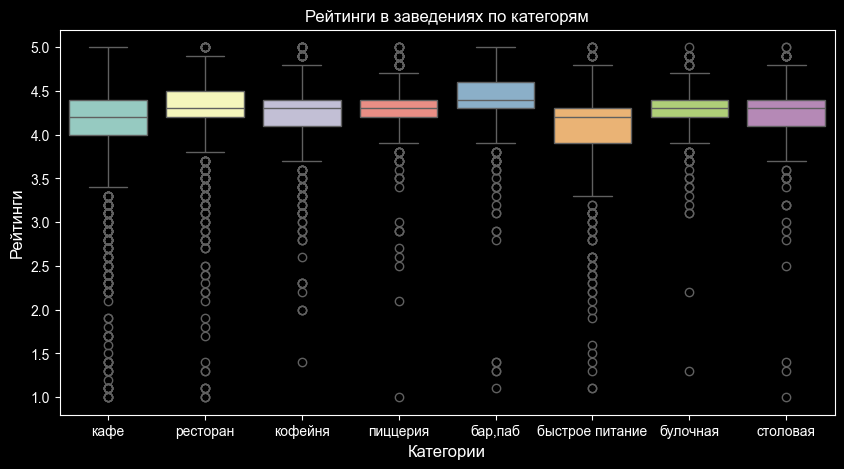

In [71]:
#обновленный график после чистки аномалий:
sns.set_style("ticks") 
plt.style.use("dark_background")

colors = sns.color_palette()

plt.figure(figsize=(10, 5))

boxplot = sns.boxplot(x=data["category"], y=data['rating'], palette=colors);
boxplot.axes.set_title("Рейтинги в заведениях по категорям", fontsize=12)
boxplot.set_xlabel("Категории", fontsize=12)
boxplot.set_ylabel("Рейтинги", fontsize=12)

### Фоновая картограмма (хороплет) 
Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы). Все заведения датасета отображены на карте с помощью кластеров средствами библиотеки folium.


In [72]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('median')
rating_data

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [134]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('C:\\Users\\A\Desktop\\Project_Coffee\\admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

In [135]:


# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:\\Users\\A\Desktop\\Project_Coffee\\admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)


# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

 Построен хороплет со средним рейтингом заведений каждого района. Все заведения отображены в виде кластеров. Самые высокие рейтинги в ЦАО

### Топ-15 улиц по количеству заведений
Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.



In [79]:
street_15 = data.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count', margins=True)
street_15 = street_15.iloc[:-1]

street_15 = street_15.sort_values(by='All', ascending=False).head(15)

street_15 = street_15.iloc[:-1, :-1]
display(street_15)


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект Мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Варшавское шоссе,6.0,NaN,7.0,17.0,14.0,4.0,20.0,7.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0


<Figure size 20000x10000 with 0 Axes>

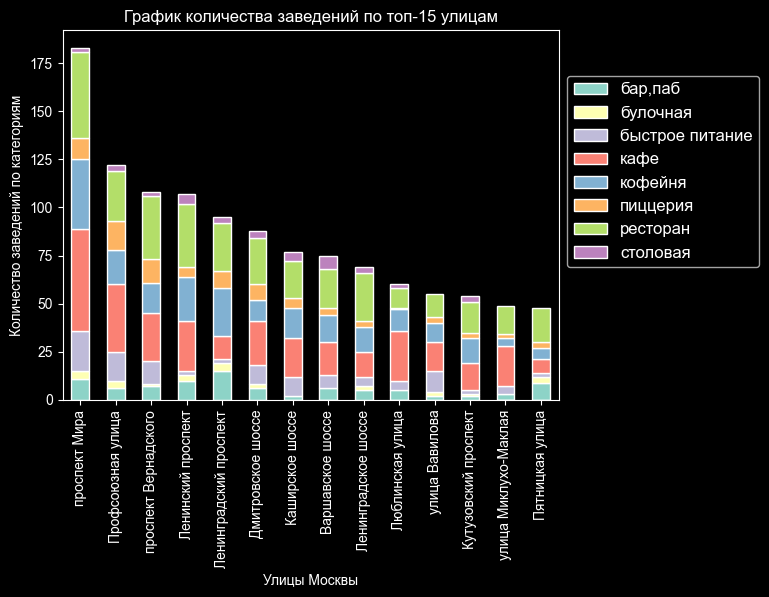

In [80]:
plt.figure(figsize=(200, 100))

street_15.plot(kind='bar', stacked=True)

plt.title('График количества заведений по топ-15 улицам')
plt.xlabel('Улицы Москвы')
plt.ylabel('Количество заведений по категориям')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

Больше всего завведений на Проспекте Мира. 
В топ-15 вошли в основном проспекты и шоссе - самые длинные по протяженности, поэтому и заведений общепита на проспектах и шоссе намного больше. А Пятницкая улица - это уже пешеходный и туристический центр в Москве, знаменитая улица с брльшим количеством баров.

### Улицы, на которых находится только один объект общепита



In [81]:
street_1 = data.pivot_table(index = ['street'],  values = 'name', aggfunc = 'count', margins=True)

street_1 = street_1.sort_values(by='name')
street_1 = street_1.query('name==1')
street_1 = street_1.merge(data, on='street')
street_1 = street_1[['street', 'name_y', 'category', 'address', 'lat', 'lng']]
street_1

,street,name_y,category,address,lat,lng
0,1-й Автозаводский проезд,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",55.704847,37.657065
1,Нащокинский переулок,Александр,кафе,"Москва, Нащокинский переулок, 14",55.746463,37.598274
2,Новая улица,Кафе,кафе,"Москва, Новая улица, 10",55.875347,37.512419
3,Новгородская улица,CofeFest,кофейня,"Москва, Новгородская улица, 23А",55.901799,37.577672
4,Новолучанская улица,Мужик у Плиты,"бар,паб","Москва, посёлок Рублёво, Новолучанская улица, 21",55.791385,37.357339
...,...,...,...,...,...,...
429,3-й Лучевой просек,Очаг,кофейня,"Москва, 3-й Лучевой просек, 3, стр. 1",55.798335,37.671233
430,Анненский проезд,Столовая в Марьиной роще,столовая,"Москва, Анненский проезд, 1, стр. 20",55.802690,37.607318
431,1-й Спасоналивковский переулок,E. D. A.,ресторан,"Москва, 1-й Спасоналивковский переулок, 8, стр. 2",55.733300,37.616710
432,1-й Сетуньский проезд,Сетунь,ресторан,"Москва, 1-й Сетуньский проезд, 10с1",55.733738,37.536305


In [82]:


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name_y']} {row['category']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
street_1.apply(create_clusters, axis=1)

# выводим карту
m

Единичные заведения на улице - распределены по всему городу, расположены как в центре, так и на окраинах. Посмотрим, есть ли зависимость от категорий. 

In [83]:
street_1=street_1.groupby('category', as_index=False)['address'].agg('count')
street_1

,category,address
0,"бар,паб",40
1,булочная,9
2,быстрое питание,18
3,кафе,150
4,кофейня,78
5,пиццерия,14
6,ресторан,89
7,столовая,36


In [84]:
# строим столбчатую диаграмму 
fig = px.bar(street_1.sort_values(by='address', ascending=True), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='address' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Единичные заведения на улице',
                   xaxis_title='Количество улиц ',
                   yaxis_title='Категория')
fig.show() # выводим график

Единичные заведения на своей улице - Преобладают кафе.

### Значения средних чеков по районам
Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. ПНеобходимо посчитать медиану этого столбца для каждого района и использовать это значение в качестве ценового индикатора района. 

In [89]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [90]:
#какое количество ненулевых значений в столбце middle_avg_bill
data[data['middle_avg_bill']>0]['name'].count()

np.int64(3148)

In [91]:
district_avg_bill=data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending=False)
district_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


<Figure size 2000x2000 with 0 Axes>

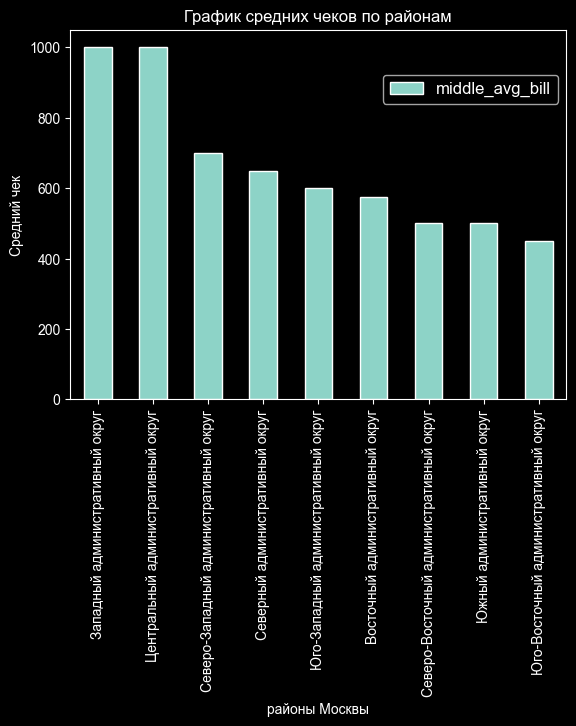

In [92]:
plt.figure(figsize=(20, 20))

district_avg_bill.plot(x='district', y='middle_avg_bill', kind='bar', stacked=True)

plt.title('График средних чеков по районам')
plt.xlabel('районы Москвы')
plt.ylabel('Средний чек')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

Наибольший средний чек в Западном и Центральном административном округе, самый низкий - Юго-Восток

### Зависимость цены в центральном административном округе и других от растояния до центра города
Как удалённость от центра влияет на цены в заведениях?


Расстояние между двумя точками равно квадратному корню из суммы квадратов разностей координат по каждой оси. Добавим столбец с расстоянием от центра города (moscow_lat, moscow_lng = 55.751244, 37.618423) до каждого заведения.

In [93]:
moscow_lat, moscow_lng = 55.751244, 37.618423
data['moscow_lat'], data['moscow_lng'] = moscow_lat, moscow_lng
data['center_msc_lat'] = (data['lat'] - data['moscow_lat'])**2
data['center_msc_lng'] = (data['lng'] - data['moscow_lng'])**2

#data['center_msc'] = sqrt(data['center_msc'])

data['center_msc'] = np.sqrt(data[['center_msc_lat', 'center_msc_lng']].sum(axis=1))
data_temp = data.sort_values(by='center_msc')


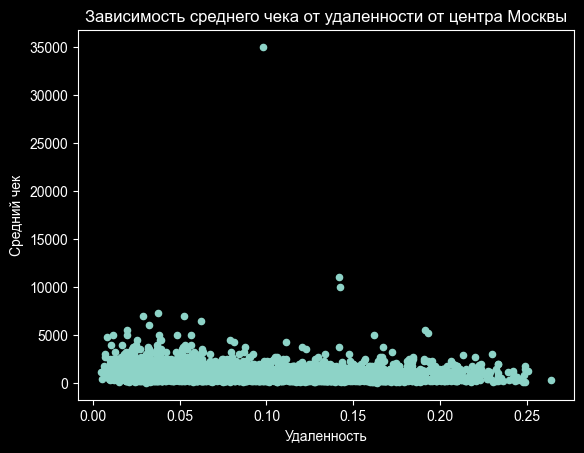

In [94]:
data_temp.plot(x='center_msc', y ='middle_avg_bill', kind='scatter') 
plt.title('Зависимость среднего чека от удаленности от центра Москвы')
plt.xlabel('Удаленность')
plt.ylabel('Средний чек')


# отображаем график на экране
plt.show()

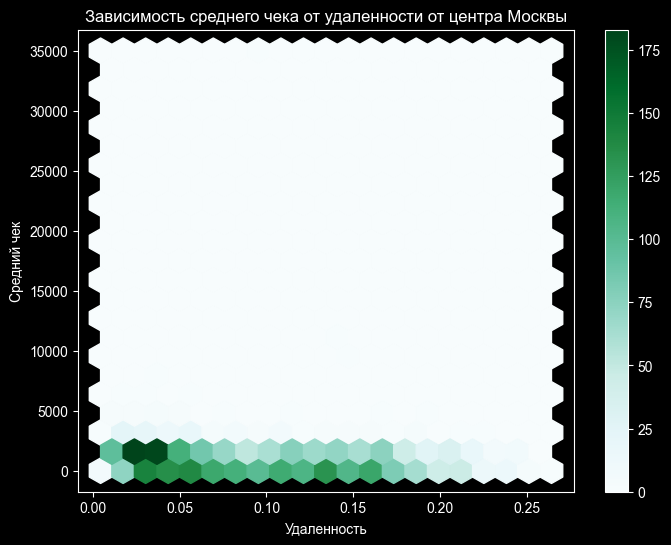

In [95]:
data_temp.plot(x='center_msc', y ='middle_avg_bill', kind='hexbin', gridsize = 20, figsize=(8,6), sharex=False) 
plt.title('Зависимость среднего чека от удаленности от центра Москвы')
plt.xlabel('Удаленность')
plt.ylabel('Средний чек')

# отображаем график на экране
plt.show()

Зависимость среднего чека от удаленности от центра Москвы явно прослеживается, чем ближе к центру - тем выше цены и больше количество заведений с более высоким чеком, хотя в центре имеются заведения со средним чеком и до 500 рублей.

Посмотрим на распределение среднего чек в центре (расстояние до центра Мск не более 0,05.

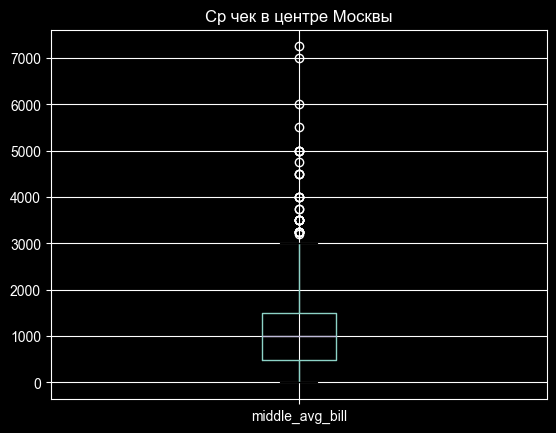

In [96]:
data_temp.query('center_msc<=0.05').boxplot('middle_avg_bill') 
plt.title('Ср чек в центре Москвы')
plt.show()

In [97]:
data_temp.query('center_msc<=0.05')['middle_avg_bill'].describe()

count     934.000000
mean     1182.976445
std       894.235146
min         0.000000
25%       475.000000
50%      1000.000000
75%      1500.000000
max      7250.000000
Name: middle_avg_bill, dtype: float64

Для центра города (расстояние до 0,05) медианное значение ср.чека составляет 1000 рублей, 3-я четверь позиций имеет ср чек 1500 рублей, максимальные значения доходят до 7000 

### Другие взаимосвязи в данных

Зависимость круглосуточности заведений от растояния до центра города. Проверим, все ли круглосуточные заведения находятся в центре?

In [98]:
# строим scatter
fig = px.scatter(data_temp,             # загружаем данные
                 x='center_msc', # указываем столбец с данными для оси X
                 y="middle_avg_bill",  # указываем столбец с данными для оси Y
                 color='is_24_7') # обозначаем категорию для разделения цветом
# оформляем график
fig.update_layout(title='Зависимость среднего чека от удаленности от центра для круглосуточных',
                   xaxis_title='Удаленность',
                   yaxis_title='Средний чек')

fig.show() # выводим график

Круглосуточных заведений в принципе не так много, но они находятмя не только в центре, да и средний чек у круглосуточных может быть повыше.

### Общий вывод:

В предоставленных данных бОльшую часть занимают кафе (2278 заведений или 28,3%) и рестораны (2043 или 24,3%)

Медианное значение количества посадочных мест для кафе и баров выше, чем в кофейнях и ресторанах. В булочных и столовых посадочных мест практически нет. 

Преобладают сетевые кафе и рестораны, а вот несетевых кофеен и пиццерий немного больше, чем сетевых.

По сетевым заведениям преобладает кофейня Шоколадница. Сетевые заведения представлены в равной степенью кофейни, пиццерии, рестораны и кафе.

По количеству заведений лидирует ЦАО, в котором преобладают бары, кофейни, кафе и рестораны. САО, СВАО, ЮАО представлены примерно одинаково, меньше всего заведений в СЗАО.

По медиане рейтинги мало отличаются: 4,2 - 4,4

 Построен хороплет со средним рейтингом заведений каждого района. Все заведения отображены в виде кластеров. Самые высокие рейтинги в ЦАО, а самые низкие - СВАО и ЮВАО.
 
 
Больше всего завведений на Проспекте Мира. В топ-15 вошли в основном проспекты и шоссе - самые длинные по протяженности, поэтому и заведений общепита на проспектах и шоссе намного больше. А Пятницкая улица - это уже пешеходный и туристический центр в Москве, знаменитая улица с брльшим количеством баров.

Единичные заведения на улице - распределены по всему городу, расположены как в центре, так и на окраинах.
Единичные заведения на своей улице - Преобладают кафе, булочных и пиццерий меньше всего.

Наибольший средний чек в Западном и Центральном административном округе, самый низкий - Юго-Восток

Зависимость среднего чека от удаленности от центра Москвы явно прослеживается, чем ближе к центру - тем выше цены и больше количество заведений с более высоким чеком, хотя в центре имеются заведения со средним чеком и до 500 рублей.

Для центра города (расстояние до 0,05) медианное значение ср.чека составляет 1000 рублей, 3-я четверь позиций имеет ср чек 1500 рублей, максимальные значения доходят до 7000

Круглосуточных заведений в принципе не так много, но они находятмя не только в центре, да и средний чек у круглосуточных может быть повыше.


## Шаг 4. Детализируем исследование: открытие кофейни
<a id='section4_id'></a>
Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.


### Сколько всего кофеен в датасете? 



In [99]:
district_coffee = data[data['category']=='кофейня']
district_coffee['category'].count()

np.int64(1413)

В датасете всего 1413 кофеен.

### В каких районах их больше всего кофеен, каковы особенности их расположения?


In [100]:
district_coffee_gr = district_coffee.groupby(['district_small'])[['name']].count().sort_values(by='name', ascending = False)
district_coffee_gr

,name
district_small,
ЦАО,428
САО,193
СВАО,159
ЗАО,150
ЮАО,131
ВАО,105
ЮЗАО,96
ЮВАО,89
СЗАО,62


<Figure size 2000x2000 with 0 Axes>

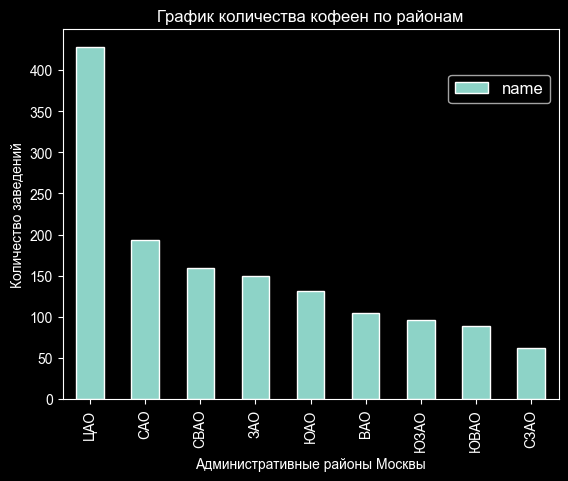

In [101]:
plt.figure(figsize=(20, 20))

district_coffee_gr.plot(kind='bar', stacked=True)

plt.title('График количества кофеен по районам')
plt.xlabel('Административные районы Москвы')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=90)
# выбираем положение легенды и указываем размер шрифта
plt.legend(bbox_to_anchor=(1, 0.9), fontsize=12)
# не добавляем сетку
# plt.grid()
# отображаем график на экране
plt.show()

По количеству кофеен преобладает ЦАО.
САО, СВАО, ЗАО и ЮАО представлены одинаково.
Меньше всего кофеен в ВАО.


Какие особенности расположения кофеен.
Посмотрим, есть ли кофейни больше чем по 1 на улице?

In [105]:
district_coffee_street = district_coffee.pivot_table(index = ['district_small', 'street'], values = 'name',  aggfunc = 'count').sort_values(by='name', ascending=False)
district_coffee_street = district_coffee_street[district_coffee_street['name']>1]
display(district_coffee_street)
district_coffee_street.groupby(['district_small'])[['name']].sum().sort_values(by='name', ascending = False)

name
district_small street                              
САО            Ленинградский проспект            25
СВАО           проспект Мира                     19
ЮЗАО           Профсоюзная улица                 18
               Ленинский проспект                18
ЦАО            проспект Мира                     17
...                                             ...
ВАО            2-й Вольный переулок               2
               7-я Парковая улица                 2
               3-я Парковая улица                 2
               улица Старый Гай                   2
САО            улица Авиаконструктора Микояна     2

[259 rows x 1 columns]

,name
district_small,
ЦАО,307
САО,142
ЗАО,119
СВАО,116
ЮАО,101
ЮЗАО,70
ВАО,64
ЮВАО,59
СЗАО,38


### Есть ли круглосуточные кофейни?


,name
is_24_7,
False,1354
True,59


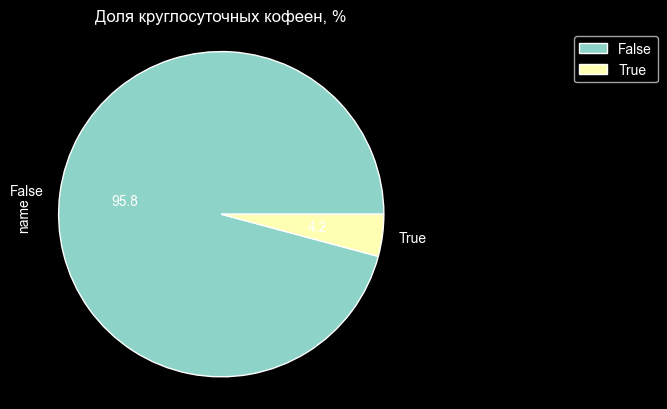

In [106]:
ax = district_coffee
ax = ax.pivot_table(index='is_24_7', values='name', aggfunc='count')
ax = ax.sort_values(by='name', ascending=False)
display(ax)

ax=ax.plot(x='is_24_7', y='name', kind='pie', autopct='%.1f', radius = 1.1)
plt.title('Доля круглосуточных кофеен, %')
ax.legend(bbox_to_anchor = (1.2, 0.5, 0.5, 0.5))
plt.show()


Доля круглосуточных кофеен - 4,2%

In [107]:
# строим scatter
fig = px.scatter(district_coffee,             # загружаем данные
                 x='district', # указываем столбец с данными для оси X
                 y="middle_avg_bill",  # указываем столбец с данными для оси Y
                 color='is_24_7') # обозначаем категорию для разделения цветом
# оформляем график
fig.update_layout(title='Зависимость среднего чека кофейни по районам для круглосуточных и некруглосуточных кофеен',
                   xaxis_title='Район',
                   yaxis_title='Средний чек')

fig.show() # выводим график

Круглосуточные кофейни есть только в 4х районах Москвы: ЦАО, СЗАО, ВАО ЗАО.

### Какие у кофеен рейтинги? Как они распределяются по районам?



In [108]:
# строим scatter
fig = px.scatter(district_coffee,             # загружаем данные
                 x='district', # указываем столбец с данными для оси X
                 y="rating",  # указываем столбец с данными для оси Y
                 color='is_24_7') # обозначаем категорию для разделения цветом
# оформляем график
fig.update_layout(title='Зависимость рейтинга кофейни по районам для круглосуточных и некруглосуточных кофеен',
                   xaxis_title='Район',
                   yaxis_title='Рейтинг')

fig.show() # выводим график

C:\Users\A\AppData\Local\Temp\ipykernel_17680\1507591087.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\A\AppData\Local\Temp\ipykernel_17680\1507591087.py:5: UserWarning:

The palette list has more values (10) than needed (9), which may not be intended.



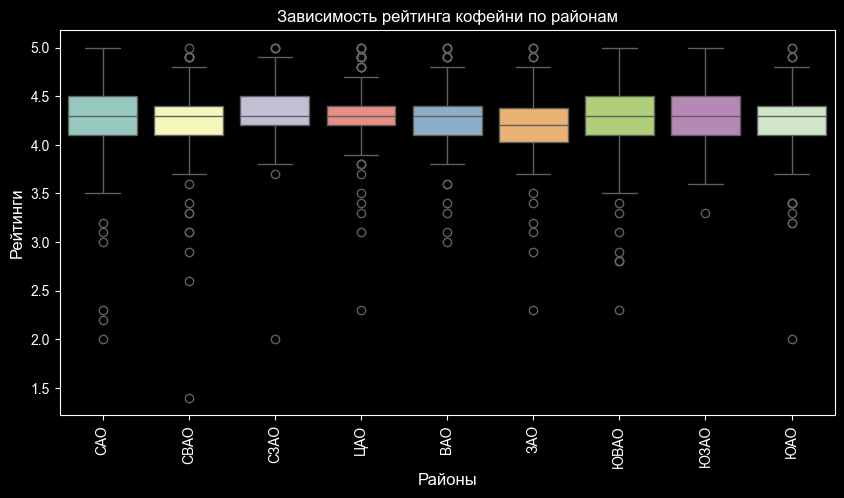

In [110]:
colors = sns.color_palette()

plt.figure(figsize=(10, 5))

boxplot = sns.boxplot(x=district_coffee["district_small"], y=district_coffee['rating'], palette=colors);
boxplot.axes.set_title("Зависимость рейтинга кофейни по районам", fontsize=12)
boxplot.set_xlabel("Районы", fontsize=12)
boxplot.set_ylabel("Рейтинги", fontsize=12)
plt.xticks(rotation=90);

In [111]:
# сгруппируем по категориям и посчитаем рейтинг по медианам 
district_coffee.groupby(['district_small'])[['rating']].median().sort_values(by='rating', ascending=False)


,rating
district_small,
ВАО,4.3
САО,4.3
СВАО,4.3
СЗАО,4.3
ЦАО,4.3
ЮАО,4.3
ЮВАО,4.3
ЮЗАО,4.3
ЗАО,4.2


Во всех районах средний рейтинг (медиана) равен 4,3, за исключением ЗАО (4,2).

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?



C:\Users\A\AppData\Local\Temp\ipykernel_17680\1363175295.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\A\AppData\Local\Temp\ipykernel_17680\1363175295.py:5: UserWarning:

The palette list has more values (10) than needed (9), which may not be intended.



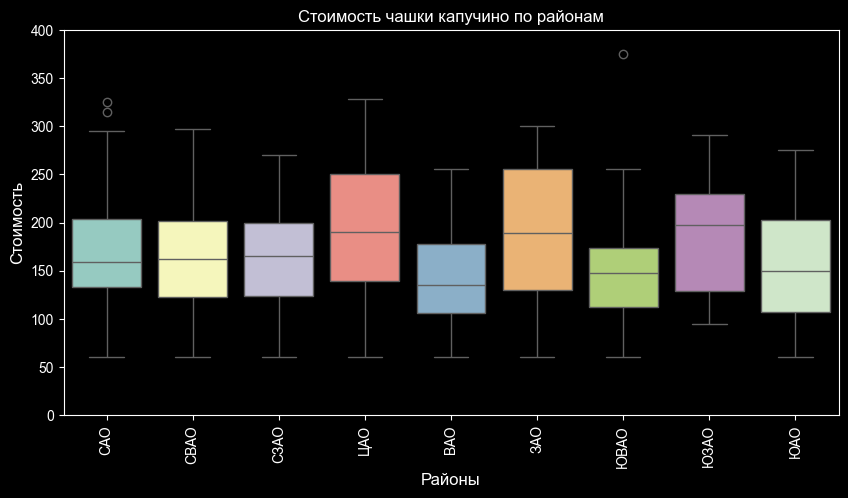

In [112]:
colors = sns.color_palette()

plt.figure(figsize=(10, 5))

boxplot = sns.boxplot(x=district_coffee["district_small"], y=district_coffee['middle_coffee_cup'], palette=colors);
boxplot.axes.set_title("Стоимость чашки капучино по районам", fontsize=12)
boxplot.set_xlabel("Районы", fontsize=12)
boxplot.set_ylabel("Стоимость", fontsize=12)
plt.ylim(0,400)
plt.xticks(rotation=90);

In [113]:
district_coffee_group = district_coffee.groupby('district_small', as_index=False)['middle_coffee_cup'].agg('median')
district_coffee_group.sort_values(by='middle_coffee_cup', ascending=False)

,district_small,middle_coffee_cup
8,ЮЗАО,198.0
5,ЦАО,190.0
1,ЗАО,189.0
4,СЗАО,165.0
3,СВАО,162.5
2,САО,159.0
6,ЮАО,150.0
7,ЮВАО,147.5
0,ВАО,135.0


Средняя стоимость чашки капучино от 135 до 200 рублей, самая высокая стоимость для ЮЗАО, ЦАО и ЗАО - 198, 190, 189 рублей.

Стоимость чашки капучино для круглосуточных кофеен по районам.

In [118]:
district_coffee24_7 = district_coffee.query('is_24_7=="True"')

In [119]:
# строим scatter
fig = px.scatter(district_coffee24_7,             # загружаем данные
                 x='district', # указываем столбец с данными для оси X
                 y="middle_coffee_cup")  # указываем столбец с данными для оси Y
                 #color='is_24_7') # обозначаем категорию для разделения цветом
# оформляем график
fig.update_layout(title='Стоимость чашки капучино по районам для круглосуточных кофеен',
                   xaxis_title='Район',
                   yaxis_title='Стоимость чашки капучино')

fig.show() # выводим график

В некоторых круглосуточных заведениях цена чашки капучино выше 250 рублей.

Ср столимость чашки капучино для выбранных районов с низким количеством действующих кофеен.

In [120]:
district_for_analyze = ['ВАО', 'ЮВАО', 'СЗАО', 'ЮЗАО']
data_analyz = data.query('district_small==@district_for_analyze')

district_coffee_group = data_analyz.groupby(['district_small', 'chain'], as_index=False)['middle_coffee_cup'].agg('median')
district_coffee_group.sort_values(by='middle_coffee_cup', ascending=False)

,district_small,chain,middle_coffee_cup
7,ЮЗАО,сетевое,199.0
6,ЮЗАО,не сетевое,190.5
2,СЗАО,не сетевое,150.0
4,ЮВАО,не сетевое,150.0
3,СЗАО,сетевое,149.0
0,ВАО,не сетевое,135.0
1,ВАО,сетевое,135.0
5,ЮВАО,сетевое,130.0


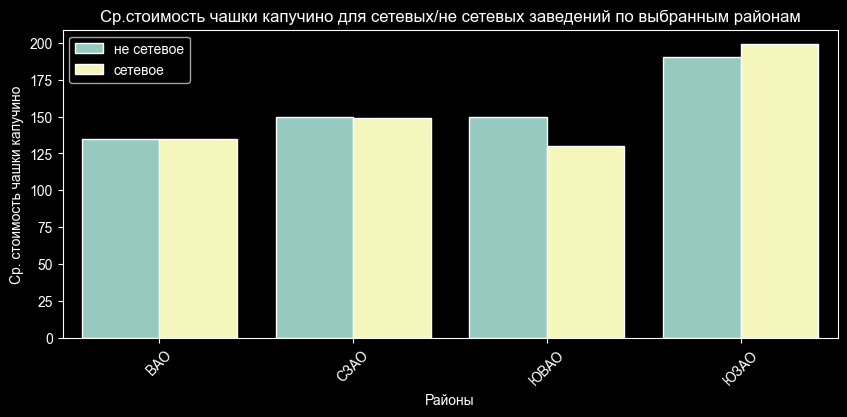

In [121]:
# назначаем размер графика
plt.figure(figsize=(10, 4))
# строим столбчатый график средствами seaborn
sns.barplot(x='district_small', y='middle_coffee_cup', data=district_coffee_group, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Ср.стоимость чашки капучино для сетевых/не сетевых заведений по выбранным районам')
plt.xlabel('Районы')
plt.ylabel('Ср. стоимость чашки капучино')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='best', fontsize=10)
# не добавляем сетку
#plt.grid()
# отображаем график на экране
plt.show()

отберем несетевые кофейни в данных районах и посмотрим распределение ср. цены чашки капучино для круглосуточных и некруглосуточных заведений.

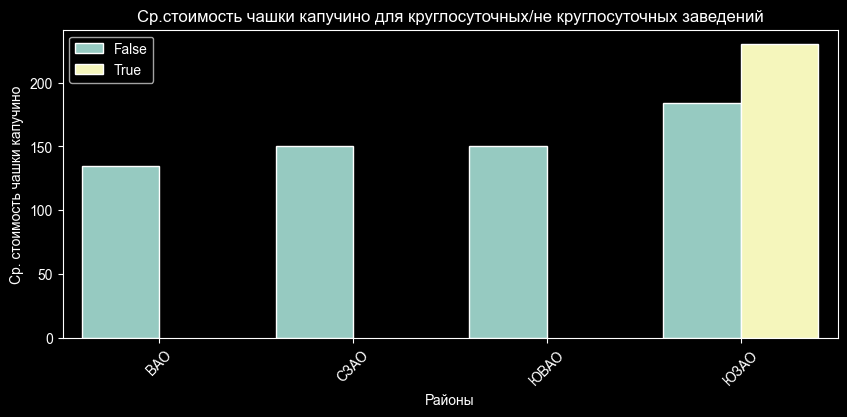

In [123]:
data_analyz = data_analyz.query('chain=="не сетевое"')

district_24 = data_analyz.groupby(['district_small', 'is_24_7'], as_index=False)['middle_coffee_cup'].agg('median')
district_24.sort_values(by='middle_coffee_cup', ascending=False)

# назначаем размер графика
plt.figure(figsize=(10, 4))
# строим столбчатый график средствами seaborn
sns.barplot(x='district_small', y='middle_coffee_cup', data=district_24, hue='is_24_7')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Ср.стоимость чашки капучино для круглосуточных/не круглосуточных заведений')
plt.xlabel('Районы')
plt.ylabel('Ср. стоимость чашки капучино')
# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='best', fontsize=10)
# не добавляем сетку
#plt.grid()
# отображаем график на экране
plt.show()

## Шаг 5. Подготовка презентации
<a id='section5_id'></a>


Презентация данного проекта по ссылке:

https://disk.yandex.ru/i/YTpLPFPxiLUsWQ


Дополнительные расчеты для презентации:

C:\Users\A\AppData\Local\Temp\ipykernel_17680\3655207131.py:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\A\AppData\Local\Temp\ipykernel_17680\3655207131.py:12: UserWarning:

The palette list has more values (10) than needed (2), which may not be intended.



(0.0, 300.0)

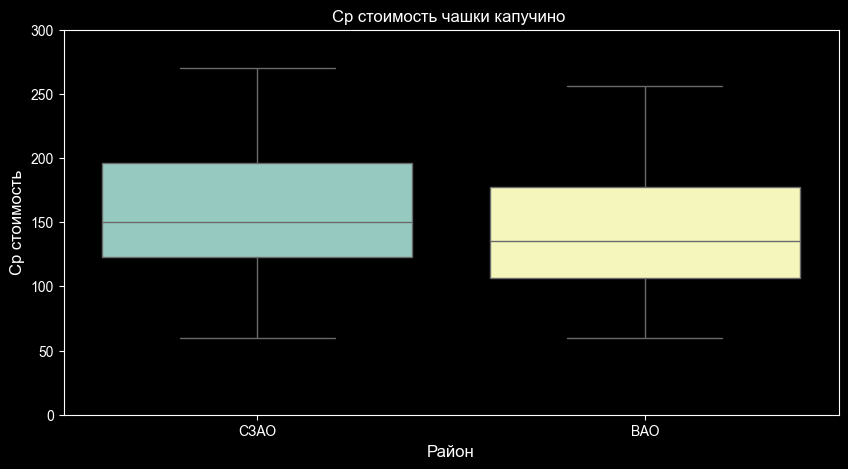

In [124]:
district_fin = ['ВАО', 'СЗАО']
data_fin = data.query('district_small==@district_fin')

#обновленный график
sns.set_style("ticks") 
plt.style.use("dark_background")

colors = sns.color_palette()

plt.figure(figsize=(10, 5))

boxplot = sns.boxplot(x=data_fin["district_small"], y=data_fin['middle_coffee_cup'], palette=colors);
boxplot.axes.set_title("Ср стоимость чашки капучино ", fontsize=12)
boxplot.set_xlabel("Район", fontsize=12)
boxplot.set_ylabel("Ср стоимость", fontsize=12)
boxplot.set_ylim(0,300)

Круглосуточные - дороже. Насколько средняя цена круглосуточных выше, чем средняя цена некруглосуточных по районам?

In [125]:
data_24_pivot = data.pivot_table(index='district', columns='is_24_7', values='middle_coffee_cup', aggfunc='median')
data_24_pivot

is_24_7,False,True
district,,
Восточный административный округ,135.0,110.0
Западный административный округ,185.0,275.0
Северный административный округ,157.0,285.0
Северо-Восточный административный округ,160.0,170.0
Северо-Западный административный округ,150.0,NaN
Центральный административный округ,190.0,256.0
Юго-Восточный административный округ,145.0,NaN
Юго-Западный административный округ,180.0,256.0
Южный административный округ,149.5,NaN


In [126]:
data_24_pivot['p_%'] = round(data_24_pivot['True']/data_24_pivot['False']*100,1)
data_24_pivot

is_24_7,False,True,p_%
district,,,
Восточный административный округ,135.0,110.0,81.5
Западный административный округ,185.0,275.0,148.6
Северный административный округ,157.0,285.0,181.5
Северо-Восточный административный округ,160.0,170.0,106.2
Северо-Западный административный округ,150.0,NaN,NaN
Центральный административный округ,190.0,256.0,134.7
Юго-Восточный административный округ,145.0,NaN,NaN
Юго-Западный административный округ,180.0,256.0,142.2
Южный административный округ,149.5,NaN,NaN


In [127]:
k_24 = data_24_pivot['p_%'].median()
k_24

np.float64(138.45)

Средняя стоимость чашки капучино по районам Москвы для круглосуточных заведений выше на 38,45% относительно не круглосуточных.
Умножим этот коэффициент на текущую стоимость в ВАО и СЗАО, чтобы определить рекомендованную стоимость в открывающемся круглосуточном заведении.

In [128]:
#расчетная стоимость чашки капучино = стоимость для некруглосуточных заведений* средний коэффициент, посчитанный выше
data_24_pivot['p_24_7'] = round(data_24_pivot['False']*k_24/100,1)

In [129]:
data_24_pivot.loc[['Восточный административный округ', 'Северо-Западный административный округ']]

is_24_7,False,True,p_%,p_24_7
district,,,,
Восточный административный округ,135.0,110.0,81.5,186.9
Северо-Западный административный округ,150.0,NaN,NaN,207.7


Рекомендованная ср стоимость чашки капучино для новых круглосуточных заведений в ВАО 187руб, в СЗАО -208 руб. 

количество мест в кофейнях по районам для несетевых круглосуточных заведений:


In [130]:
data_24_7_notchain = data.query('is_24_7=="True" & category=="кофейня"')


In [131]:
data_24_7_notchain['seats'].unique()

array([nan])

В круглосуточных заведениях, как правило, количество мест не указано.

## Выводы по проекту:

проведен анализ действующих заведений общепита в Москве для формирования понимания категорий действующих заведений, среднего чека, сетевых/не сетевых, круглосуточных/не круглосуточных заведений, а также выбора потенциального вида бизнеса. 

Выбрана категория потенциального 	заведения для открытия бизнеса (кофейни),

определены районы с минимальным 	количеством конкурентов(ВАО, СЗАО, ЮЗАО и ЮВАО),

Проанализированы средние чеки:

в ЮЗАО чашка капучино стоит дороже

в ВАО, СЗАО и ЮВАО нет круглосуточных заведений

Круглосуточные - дороже

в ЮВАО сетевые кофейни демпингуют цены

ВАО и СЗАО - районы наиболее привлекательные для открытия кофейни.


### Финальные рекомендации.
Выбор района:  ВАО, СЗАО
Категория заведения: кофейня
Тип: круглосуточное 24/7
Средняя стоимость чашки капучино:
	ВАО – 187 руб.
	СЗАО – 208 руб.
Количество мест в кофейнях, как правило, не указано.